### Exploratory Data Analysis

In [27]:
import nfl_data_py as nfl
from DataPipelineFxn import *
from pyspark.sql.functions import col
from pyspark.sql.functions import lit
import plotly.express as px

In [3]:
# get the data
data = GetBaseDataFrame()

2000 done.
2001 done.
2002 done.
2003 done.
2004 done.
2005 done.
2006 done.
2007 done.
2008 done.
2009 done.
2010 done.
2011 done.
2012 done.
2013 done.
2014 done.
2015 done.
2016 done.
2017 done.
2018 done.
2019 done.
2020 done.
2021 done.
2022 done.
2023 done.


Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
24/12/02 16:37:51 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable
24/12/02 16:37:52 WARN Utils: Service 'SparkUI' could not bind on port 4040. Attempting port 4041.
24/12/02 16:38:08 WARN package: Truncated the string representation of a plan since it was too large. This behavior can be adjusted by setting 'spark.sql.debug.maxToStringFields'.
24/12/02 16:38:08 WARN TaskSetManager: Stage 0 contains a task of very large size (9437 KiB). The maximum recommended task size is 1000 KiB.


#### 3a. Yards to Go

24/12/02 16:53:03 WARN TaskSetManager: Stage 20 contains a task of very large size (9437 KiB). The maximum recommended task size is 1000 KiB.


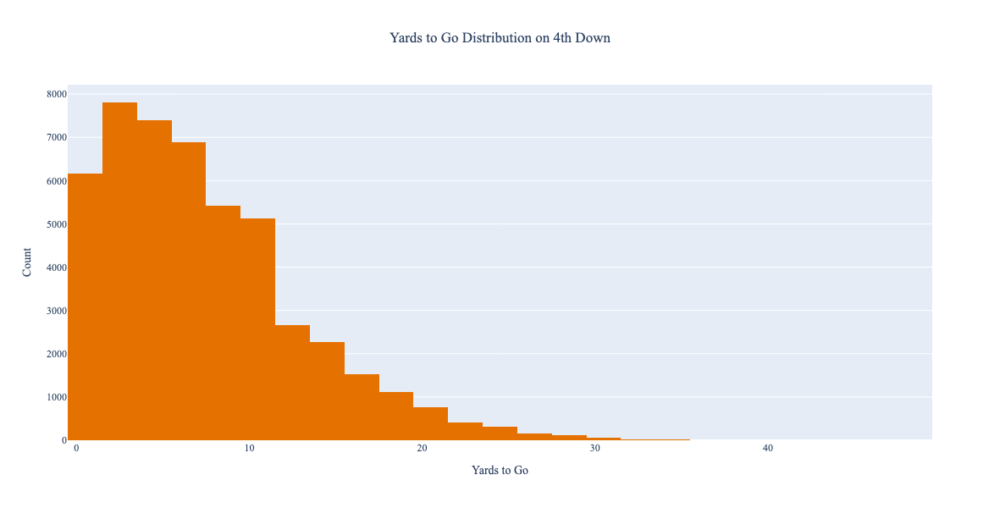

In [38]:
yardstogo = data.select(col('ydstogo')).toPandas()

fig = px.histogram(
    yardstogo['ydstogo'],
    nbins = 46,
    color_discrete_sequence = ['#E57200'],
    title = 'Yards to Go Distribution on 4th Down',
    width = 1000,
    height = 600
)

fig.update_layout(
    xaxis_title = 'Yards to Go',
    yaxis_title = 'Count',
    showlegend=False,
    title_x = 0.5,
    font_family = 'Times New Roman'
)

fig.show()

#### 3b. Yardline

24/12/02 16:53:32 WARN TaskSetManager: Stage 21 contains a task of very large size (9437 KiB). The maximum recommended task size is 1000 KiB.


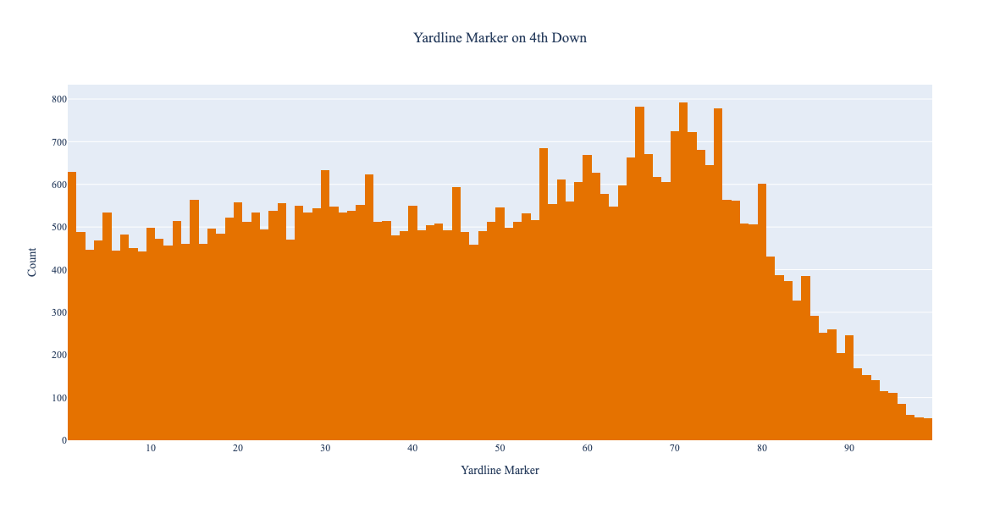

In [39]:
yardline = data.select(col('yardline_100')).toPandas()

# histrogram of yards to go
fig = px.histogram(
    yardline['yardline_100'],
    nbins = 100,
    color_discrete_sequence = ['#E57200'],
    title = 'Yardline Marker on 4th Down',
    width = 1000,
    height = 600
)

fig.update_layout(
    xaxis_title = 'Yardline Marker',
    yaxis_title = 'Count',
    showlegend=False,
    title_x = 0.5,
    font_family = 'Times New Roman'
)

fig.show()

#### 3c. Yards to Go and Play Type

24/12/02 16:54:06 WARN TaskSetManager: Stage 22 contains a task of very large size (9437 KiB). The maximum recommended task size is 1000 KiB.


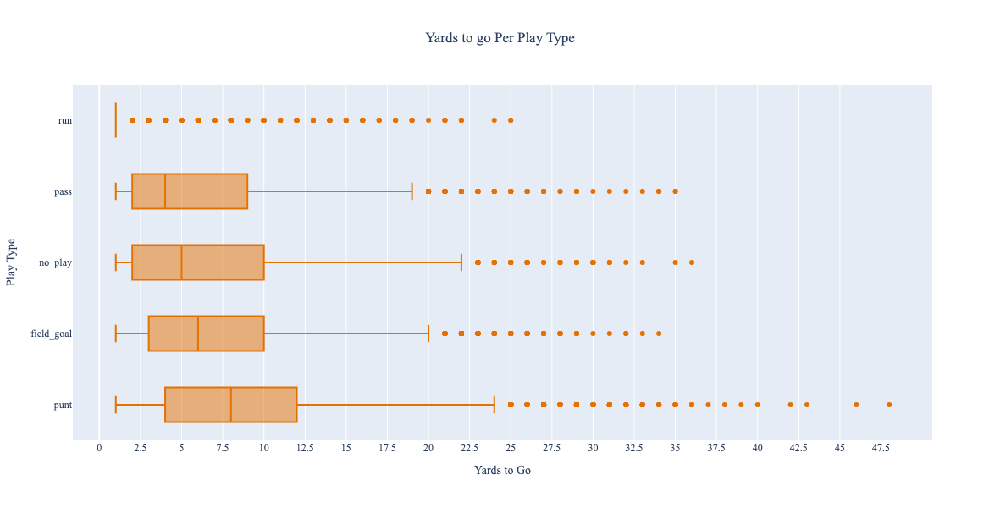

In [40]:
yrds_per_playtype = data.select([col('ydstogo'), col('play_type')]).toPandas()

fig = px.box(
    x = yrds_per_playtype['ydstogo'],
    y = yrds_per_playtype['play_type'],
    color_discrete_sequence = ['#E57200'],
    title = 'Yards to go Per Play Type',
    width = 1000,
    height = 600
)

fig.update_layout(
    yaxis_title = 'Play Type',
    xaxis_title = 'Yards to Go',
    showlegend=False,
    title_x = 0.5,
    font_family = 'Times New Roman',
    xaxis_tickvals = np.arange(50, step = 2.5),
    yaxis_categoryorder = 'mean descending'
)

fig.show()

#### 3d. Total yards left to go per playtype

24/12/02 16:54:28 WARN TaskSetManager: Stage 23 contains a task of very large size (9437 KiB). The maximum recommended task size is 1000 KiB.


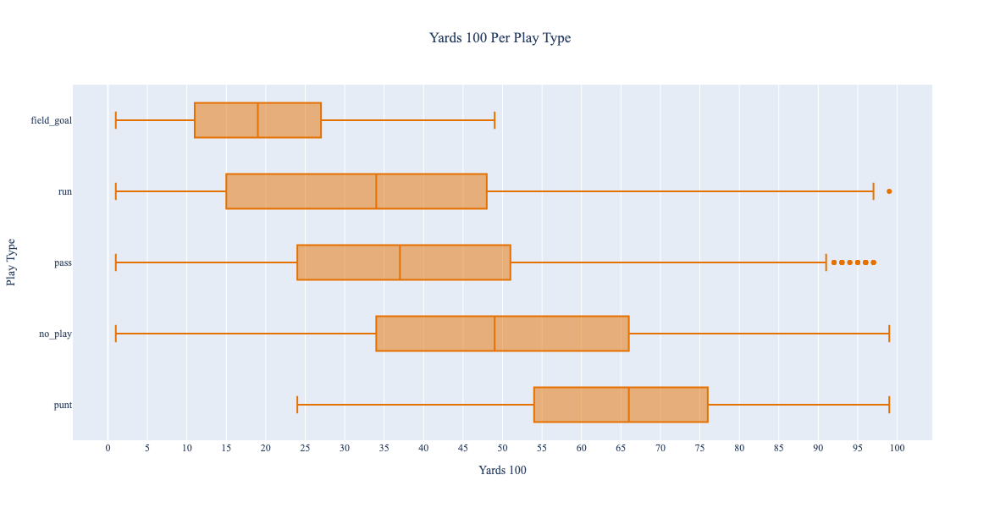

In [41]:
yrdline_per_playtype = data.select([col('yardline_100'), col('play_type')]).toPandas()

fig = px.box(
    x = yrdline_per_playtype['yardline_100'],
    y = yrdline_per_playtype['play_type'],
    color_discrete_sequence = ['#E57200'],
    title = 'Yards 100 Per Play Type',
    width = 1000,
    height = 600
)

fig.update_layout(
    yaxis_title = 'Play Type',
    xaxis_title = 'Yards 100',
    showlegend=False,
    title_x = 0.5,
    font_family = 'Times New Roman',
    xaxis_tickvals = np.arange(105, step = 5),
    yaxis_categoryorder = 'mean descending'
)


fig.show()

#### 3f. Play Type Over Different Seasons

In [24]:
# get counts for plays per year
count_data = data.select([col('play_type'), col('season')])\
    .withColumn('count', lit(1))\
    .groupby([col('play_type'), col('season')])\
    .agg(F.count('play_type'))\
    .toPandas()

24/12/02 16:45:00 WARN TaskSetManager: Stage 17 contains a task of very large size (9437 KiB). The maximum recommended task size is 1000 KiB.


In [33]:
count_data.sort_values('season')

,play_type,season,count(play_type)
21,field_goal,2000,560
24,run,2000,113
40,punt,2000,1041
4,no_play,2000,128
16,pass,2000,181
...,...,...,...
89,punt,2023,958
88,field_goal,2023,619
105,no_play,2023,148
103,run,2023,198


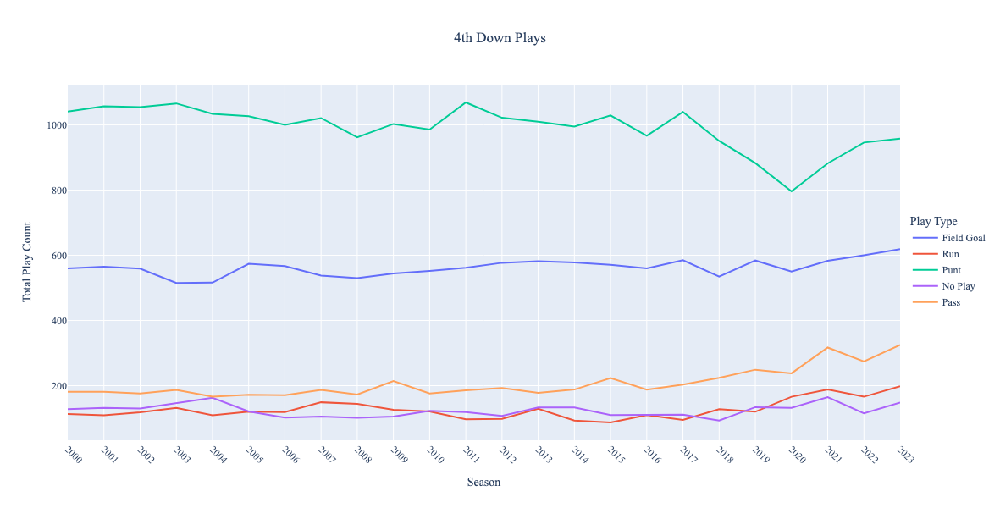

In [49]:
# visualize with plotly
fig = px.line(
    count_data.sort_values('season'), 
    x="season", y="count(play_type)", 
    color="play_type", 
    title="4th Down Plays", 
    width=1000, height=600
)

years = [x for x in range(2000, 2024)]

fig.update_xaxes(
    tickmode='array',
    tickvals=years,  # Specify the desired tick values
    ticktext=years, # Specify the corresponding labels
)

# '''
fig.update_layout(
    legend=dict(
            # yanchor="top",
            y=0.5,
            # xanchor="right",
            x=1.01,
            title = 'Play Type'
        ),
    xaxis_title = 'Season',
    yaxis_title = 'Total Play Count',
    xaxis_tickangle = 45,
    title_x = 0.5,
    font_family = 'Times New Roman'
)

# update the legend names
newnames = {
    'field_goal':'Field Goal', 
    'run': 'Run',
    'punt': 'Punt',
    'no_play': 'No Play',
    'pass': 'Pass'
}

fig.for_each_trace(lambda t: t.update(
    name = newnames[t.name],
    legendgroup = newnames[t.name],
    hovertemplate = t.hovertemplate.replace(t.name, newnames[t.name])
 )
)

fig.show()

#### 3g. Wind & Temp

24/12/02 17:05:17 WARN TaskSetManager: Stage 28 contains a task of very large size (9437 KiB). The maximum recommended task size is 1000 KiB.


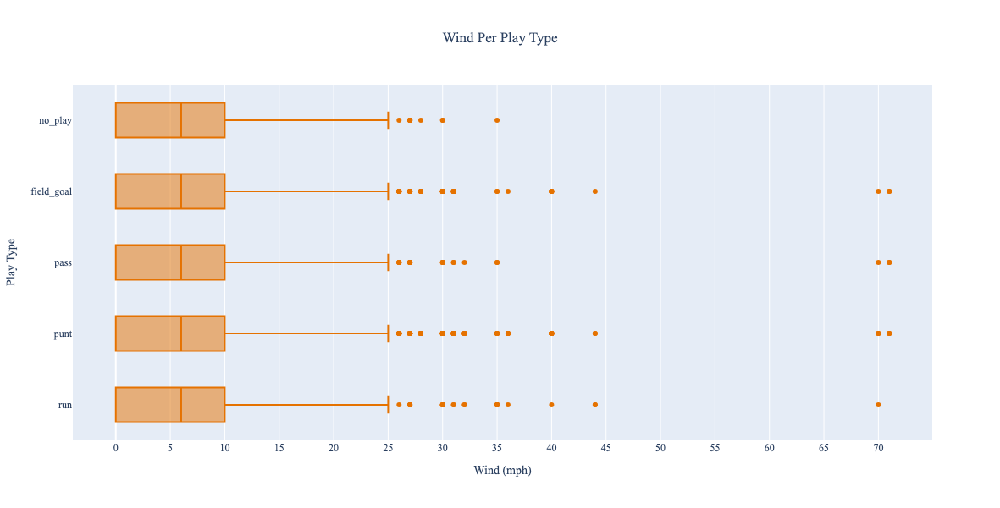

In [55]:
wind_per_playtype = data.select([col('wind'), col('play_type')]).toPandas()

fig = px.box(
    x = wind_per_playtype['wind'],
    y = wind_per_playtype['play_type'],
    color_discrete_sequence = ['#E57200'],
    title = 'Wind Per Play Type',
    width = 1000,
    height = 600
)

fig.update_layout(
    yaxis_title = 'Play Type',
    xaxis_title = 'Wind (mph)',
    showlegend=False,
    title_x = 0.5,
    font_family = 'Times New Roman',
    xaxis_tickvals = np.arange(105, step = 5),
    yaxis_categoryorder = 'mean descending'
)

fig.show()

24/12/02 17:05:36 WARN TaskSetManager: Stage 29 contains a task of very large size (9437 KiB). The maximum recommended task size is 1000 KiB.


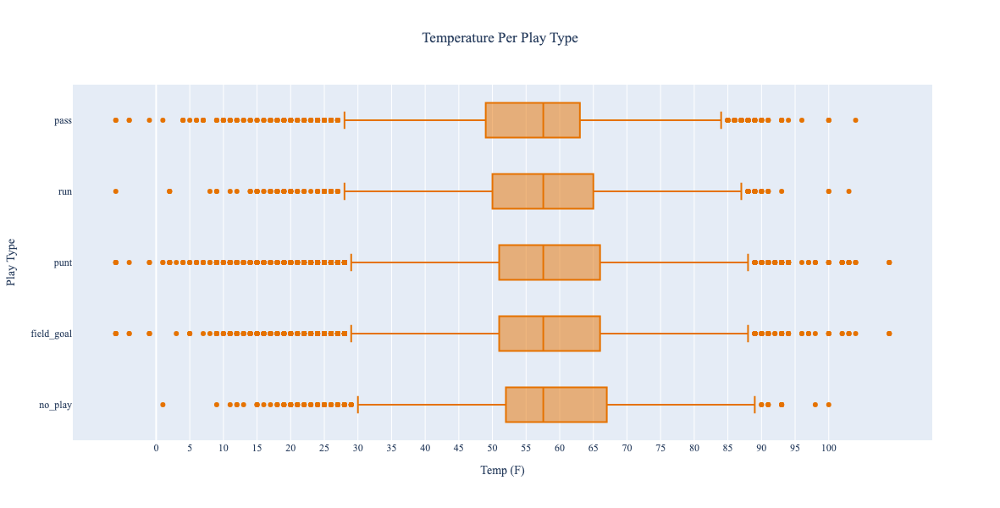

In [56]:
temp_per_playtype = data.select([col('temp'), col('play_type')]).toPandas()

fig = px.box(
    x = temp_per_playtype['temp'],
    y = temp_per_playtype['play_type'],
    color_discrete_sequence = ['#E57200'],
    title = 'Temperature Per Play Type',
    width = 1000,
    height = 600
)

fig.update_layout(
    yaxis_title = 'Play Type',
    xaxis_title = 'Temp (F)',
    showlegend=False,
    title_x = 0.5,
    font_family = 'Times New Roman',
    xaxis_tickvals = np.arange(105, step = 5),
    yaxis_categoryorder = 'mean descending'
)

fig.show()

In [61]:
bal_data = data.filter(col('posteam') == 'PHI')\
    .select(col('play_type'), col('season'))\
    .groupby([col('play_type'), col('season')])\
    .agg(F.count('play_type'))\
    .toPandas()

fig = px.line(
    bal_data.sort_values('season'), 
    x="season", y="count(play_type)", 
    color="play_type", 
    title="4th Down Plays", 
    width=1000, height=600
)

years = [x for x in range(2000, 2024)]

fig.update_xaxes(
    tickmode='array',
    tickvals=years,  # Specify the desired tick values
    ticktext=years, # Specify the corresponding labels
)

# '''
fig.update_layout(
    legend=dict(
            # yanchor="top",
            y=0.5,
            # xanchor="right",
            x=1.01,
            title = 'Play Type'
        ),
    xaxis_title = 'Season',
    yaxis_title = 'Total Play Count',
    xaxis_tickangle = 45,
    title_x = 0.5,
    font_family = 'Times New Roman'
)

# update the legend names
newnames = {
    'field_goal':'Field Goal', 
    'run': 'Run',
    'punt': 'Punt',
    'no_play': 'No Play',
    'pass': 'Pass'
}

fig.for_each_trace(lambda t: t.update(
    name = newnames[t.name],
    legendgroup = newnames[t.name],
    hovertemplate = t.hovertemplate.replace(t.name, newnames[t.name])
 )
)

fig.show()

24/12/02 17:09:50 WARN TaskSetManager: Stage 35 contains a task of very large size (9437 KiB). The maximum recommended task size is 1000 KiB.
